# NLP Tweets

In [227]:
import nltk
import pandas as pd
pd.set_option('future.no_silent_downcasting', True)

## Loading data

In [228]:
data = pd.read_csv('data/twitter_training.csv', names=['id', 'entity', 'sentiment', 'tweet'])

In [229]:
data.head()

,id,entity,sentiment,tweet
0,2401,Borderlands,Positive,"im getting on borderlands and i will murder you all ,"
1,2401,Borderlands,Positive,"I am coming to the borders and I will kill you all,"
2,2401,Borderlands,Positive,"im getting on borderlands and i will kill you all,"
3,2401,Borderlands,Positive,"im coming on borderlands and i will murder you all,"
4,2401,Borderlands,Positive,"im getting on borderlands 2 and i will murder you me all,"


## Filter Negative and Positive Tweets

In [230]:
filter_pos_neg = (data['sentiment'] == 'Positive') | (data['sentiment'] == 'Negative')
data = data[filter_pos_neg]

In [231]:
data['sentiment'] = data['sentiment'].map({'Positive': 1, 'Negative': 0})

In [232]:
data = data.dropna()

## CountVectorizer

In [233]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=50)
tweets_vec = vectorizer.fit_transform(data['tweet'])
tweets_vec

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 218712 stored elements and shape (43013, 50)>

## Tweets Bag of Words

In [234]:
tweet_df = pd.DataFrame.sparse.from_spmatrix(tweets_vec, columns=vectorizer.get_feature_names_out())
tweet_df

,about,all,and,are,as,at,be,but,can,com,...,to,twitter,was,we,what,when,why,with,you,your
0,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,1,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
2,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43008,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43009,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43010,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43011,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## WordCloud of Tweets

In [235]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_tweets = ' '.join(data['tweet'])
all_tweets

'im getting on borderlands and i will murder you all , I am coming to the borders and I will kill you all, im getting on borderlands and i will kill you all, im coming on borderlands and i will murder you all, im getting on borderlands 2 and i will murder you me all, im getting into borderlands and i can murder you all, So I spent a few hours making something for fun. . . If you don\'t know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg So I spent a couple of hours doing something for fun... If you don\'t know that I\'m a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here\'s the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg So I spent a few hours doing something for fun... If you don\'t know I\'m a HUGE @ Borderland

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

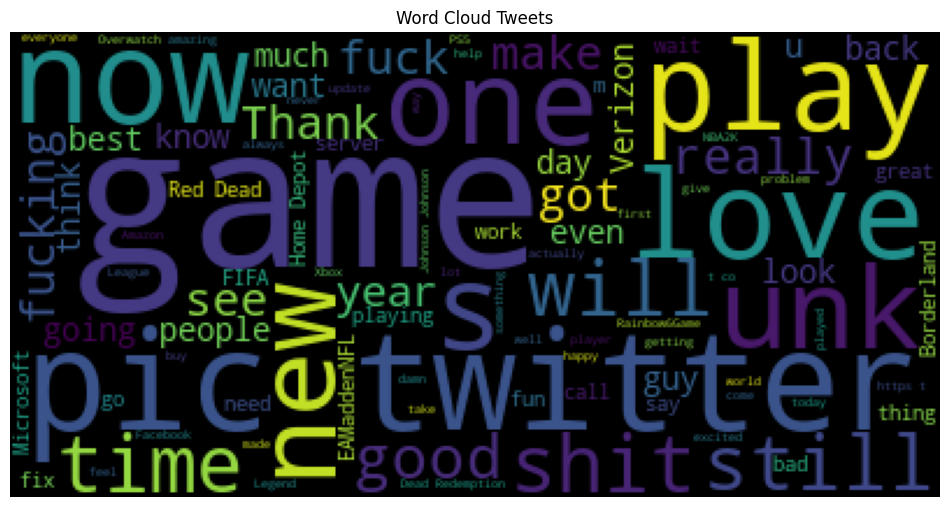

In [236]:
wordcloud = WordCloud().generate(all_tweets)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Word Cloud Postive Tweets

In [237]:
filter_pos = (data['sentiment'] == 1)
all_tweets_pos = ' '.join(data[filter_pos]['tweet'])
all_tweets_pos

'im getting on borderlands and i will murder you all , I am coming to the borders and I will kill you all, im getting on borderlands and i will kill you all, im coming on borderlands and i will murder you all, im getting on borderlands 2 and i will murder you me all, im getting into borderlands and i can murder you all, So I spent a few hours making something for fun. . . If you don\'t know I am a HUGE @Borderlands fan and Maya is one of my favorite characters. So I decided to make myself a wallpaper for my PC. . Here is the original image versus the creation I made :) Enjoy! pic.twitter.com/mLsI5wf9Jg So I spent a couple of hours doing something for fun... If you don\'t know that I\'m a huge @ Borderlands fan and Maya is one of my favorite characters, I decided to make a wallpaper for my PC.. Here\'s the original picture compared to the creation I made:) Have fun! pic.twitter.com / mLsI5wf9Jg So I spent a few hours doing something for fun... If you don\'t know I\'m a HUGE @ Borderland

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

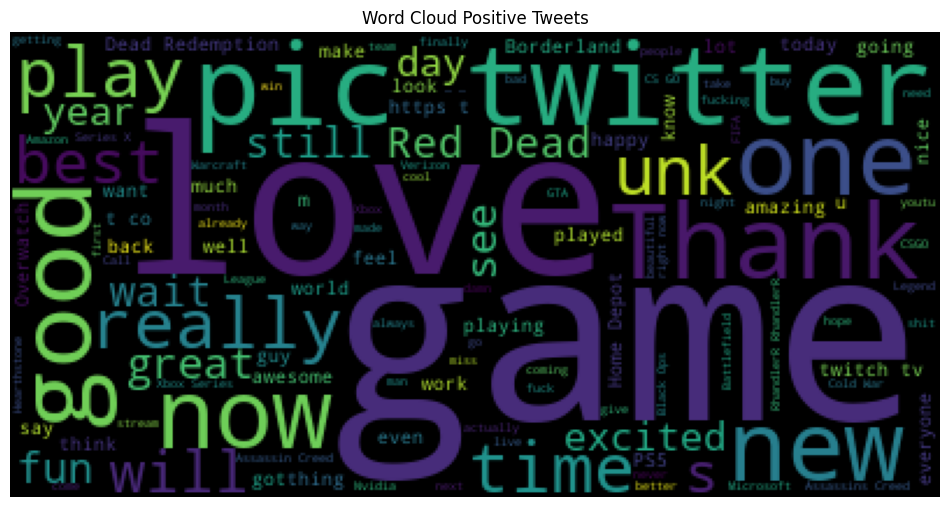

In [238]:
wordcloud = WordCloud().generate(all_tweets_pos)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Positive Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Word Cloud Negative Tweets

In [239]:
filter_neg = (data['sentiment'] == 0)
all_tweets_neg = ' '.join(data[filter_neg]['tweet'])
all_tweets_neg

'the biggest dissappoinment in my life came out a year ago fuck borderlands 3 The biggest disappointment of my life came a year ago. The biggest disappointment of my life came a year ago. the biggest dissappoinment in my life coming out a year ago fuck borderlands 3 For the biggest male dissappoinment in my life came hanging out a year time ago fuck borderlands 3 the biggest dissappoinment in my life came back last year ago fuck borderlands last Man Gearbox really needs to fix this dissapointing drops in the new Borderlands 3 DLC cant be fine to farm bosses on Mayhem 10 to get 1 legendary drop while anywhere else i get 6-10 drops. . Really sucks alot Man Gearbox really needs to fix these disappointing drops in the new Borderlands 3 DLC for farm bosses on Mayhem 10 to get a legendary drop, while I get 6-10 drops elsewhere. Man Gearbox really needs to fix this disssapointing drops in the new Borderlands 3 DLC cant be fine to farm bosses on Mayhem 10 to get 1 legendary drop while elsewher

(np.float64(-0.5), np.float64(399.5), np.float64(199.5), np.float64(-0.5))

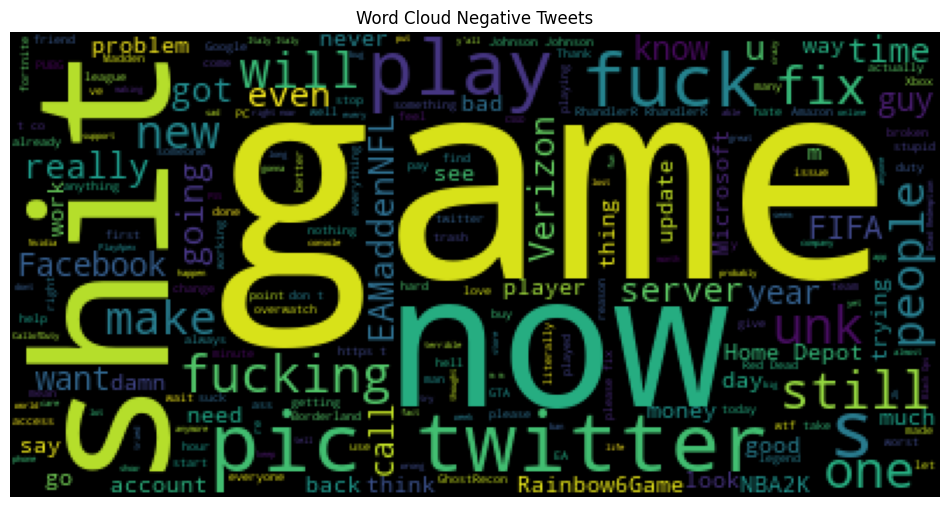

In [240]:
wordcloud = WordCloud().generate(all_tweets_neg)
plt.figure(figsize=(12, 8))
plt.title('Word Cloud Negative Tweets')
plt.imshow(wordcloud)
plt.axis("off")

## Tokenize Tweets

In [241]:
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     C:\Users\Victor
[nltk_data]    |     Dantas\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagge

True

In [242]:
from nltk import tokenize

tokenizer = tokenize.WhitespaceTokenizer()
data['tweet_tokens'] = data['tweet'].apply(tokenizer.tokenize)

data

,id,entity,sentiment,tweet,tweet_tokens
0,2401,Borderlands,1,"im getting on borderlands and i will murder you all ,","[im, getting, on, borderlands, and, i, will, murder, you, all, ,]"
1,2401,Borderlands,1,"I am coming to the borders and I will kill you all,","[I, am, coming, to, the, borders, and, I, will, kill, you, all,]"
2,2401,Borderlands,1,"im getting on borderlands and i will kill you all,","[im, getting, on, borderlands, and, i, will, kill, you, all,]"
3,2401,Borderlands,1,"im coming on borderlands and i will murder you all,","[im, coming, on, borderlands, and, i, will, murder, you, all,]"
4,2401,Borderlands,1,"im getting on borderlands 2 and i will murder you me all,","[im, getting, on, borderlands, 2, and, i, will, murder, you, me, all,]"
...,...,...,...,...,...
74677,9200,Nvidia,1,Just realized that the Windows partition of my Mac is like 6 years behind Nvidia drivers and I have no idea how I did not notice,"[Just, realized, that, the, Windows, partition, of, my, Mac, is, like, 6, years, behind, Nvidia, drivers, and, I, have, no, idea, how, I, did, not, notice]"
74678,9200,Nvidia,1,Just realized that my Mac window partition is 6 years behind on Nvidia drivers and I have no idea how I didn't notice,"[Just, realized, that, my, Mac, window, partition, is, 6, years, behind, on, Nvidia, drivers, and, I, have, no, idea, how, I, didn't, notice]"
74679,9200,Nvidia,1,Just realized the windows partition of my Mac is now 6 years behind on Nvidia drivers and I have no idea how he didn’t notice,"[Just, realized, the, windows, partition, of, my, Mac, is, now, 6, years, behind, on, Nvidia, drivers, and, I, have, no, idea, how, he, didn’t, notice]"
74680,9200,Nvidia,1,Just realized between the windows partition of my Mac is like being 6 years behind on Nvidia drivers and cars I have no fucking idea how I ever didn ’ t notice,"[Just, realized, between, the, windows, partition, of, my, Mac, is, like, being, 6, years, behind, on, Nvidia, drivers, and, cars, I, have, no, fucking, idea, how, I, ever, didn, ’, t, notice]"


## Verifying Frequence of Words

In [243]:
from nltk import FreqDist

tokens_all_tweets = tokenizer.tokenize(all_tweets)
freq_dist = FreqDist(tokens_all_tweets)
freq_dist

FreqDist({'the': 22656, 'I': 16643, 'to': 16186, 'and': 14426, 'a': 12529, 'is': 10507, 'of': 10434, 'for': 8184, 'in': 7905, '@': 7021, ...})

In [244]:
dist_freq_tokens = pd.DataFrame({'Word': list(freq_dist.keys()), 'Frequency': list(freq_dist.values())})
dist_freq_tokens.nlargest(10, 'Frequency')

,Word,Frequency
15,the,22656
11,I,16643
14,to,16186
4,and,14426
25,a,12529
40,is,10507
42,of,10434
30,for,8184
84,in,7905
66,@,7021


# Exercise NLP Studies

## Preprocessing Data

In [255]:
from pandas import DataFrame
from nltk.tokenize import WordPunctTokenizer

def drop_na(df: DataFrame) -> None:
    """
    Drop rows that have NA values.
    Args:
        df: DataFrame containing data to be dropped.

    Returns:

    """
    df.dropna(inplace=True)

def remove_stopwords(df: DataFrame, column_tokens: str, stop_words: list) -> None:
    """
    Remove stopwords from a dataframe column.
    Args:
        df: DataFrame containing column to remove stopwords from.
        column_tokens: Column containing tokens to remove stopwords from.
        stop_words: List of stopwords to remove.

    Returns:

    """
    words_processed = []
    for tweet in df[column_tokens]:
        clean_tokens = [word for word in tweet if word not in stop_words]
        words_processed.append(clean_tokens)
    df[column_tokens] = words_processed

def tokenize_column(df: DataFrame, tokenizer: WordPunctTokenizer, column_text: str, column_tokens: str) -> None:
    """
    Tokenize a column using a tokenizer.
    Args:
        df: DataFrame containing column to tokenize.
        tokenizer: Tokenizer object.
        column_text: Column containing text to tokenize.
        column_tokens: Column to insert tokens in.

    Returns:

    """
    df[column_tokens] = df[column_text].apply(tokenizer.tokenize)

def remove_punctuation_tokens(df: DataFrame, column_tokens: str) -> None:
    """
    Remove punctuation tokens from a dataframe column.
    Args:
        df: DataFrame containing column to remove punctuation tokens from.
        column_tokens: Column containing tokens to remove punctuation from.

    Returns:

    """
    words_processed = []
    for tweet in df[column_tokens]:
        clean_tokens = [word for word in tweet if word.isalpha()]
        words_processed.append(clean_tokens)
    df[column_tokens] = words_processed

def to_lower(df: DataFrame, column_text: str) -> None:
    """
    Convert text to lowercase.
    Args:
        df: DataFrame containing text to lowercase.
        column_text: Column containing text to lowercase.

    Returns:

    """
    words_processed = []
    for tweet in df[column_text]:
        words_processed.append(tweet.lower())
    df[column_text] = words_processed

def filter_label(df: DataFrame, column_label: str) -> None:
    """
    Filter out labels from a dataframe column.
    Args:
        df: DataFrame containing column to filter.
        column_label: Column containing label to filter.

    Returns:

    """
    query = (df[column_label] == 'Positive') | (df[column_label] == 'Negative')
    df.drop(df[~query].index, inplace=True)

def map_label(df: DataFrame, column_label: str) -> None:
    """
    Map labels from a dataframe column.
    Args:
        df: DataFrame containing column to map.
        column_label: Column containing label to map.

    Returns:

    """
    df[column_label] = df[column_label].map({'Positive': 1, 'Negative': 0})

def process_tweets(df: DataFrame, tokenizer: WordPunctTokenizer, stop_words: list, column_text: str, column_tokens: str, column_label: str) -> None:
    """
    Apply transformations to a dataframe.
    Args:
        df: DataFrame containing column to transform.
        tokenizer: Tokenizer object.
        stop_words: Stop words to remove.
        column_text: Column containing text to tokenize.
        column_tokens: Column to insert tokens in.
        column_label: Column containing label.

    Returns:

    """
    drop_na(df)
    to_lower(df, column_text)
    filter_label(df, column_label)
    map_label(df, column_label)
    tokenize_column(df, tokenizer, column_text, column_tokens)
    remove_stopwords(df, column_tokens, stop_words)
    remove_punctuation_tokens(df, column_tokens)

## Loading Stop Words and Init Tokenizer

In [256]:
from nltk import tokenize

stop_words_en = nltk.corpus.stopwords.words('english')

tokenizer = tokenize.WordPunctTokenizer()

## Loading Train Data

In [257]:
data = pd.read_csv('data/twitter_training.csv', names=['id', 'entity', 'sentiment', 'tweet'])
process_tweets(data, tokenizer, stop_words_en, 'tweet', 'tweet_tokens', 'sentiment')
data

,id,entity,sentiment,tweet,tweet_tokens
0,2401,Borderlands,1,"im getting on borderlands and i will murder you all ,","[im, getting, borderlands, murder]"
1,2401,Borderlands,1,"i am coming to the borders and i will kill you all,","[coming, borders, kill]"
2,2401,Borderlands,1,"im getting on borderlands and i will kill you all,","[im, getting, borderlands, kill]"
3,2401,Borderlands,1,"im coming on borderlands and i will murder you all,","[im, coming, borderlands, murder]"
4,2401,Borderlands,1,"im getting on borderlands 2 and i will murder you me all,","[im, getting, borderlands, murder]"
...,...,...,...,...,...
74677,9200,Nvidia,1,just realized that the windows partition of my mac is like 6 years behind nvidia drivers and i have no idea how i did not notice,"[realized, windows, partition, mac, like, years, behind, nvidia, drivers, idea, notice]"
74678,9200,Nvidia,1,just realized that my mac window partition is 6 years behind on nvidia drivers and i have no idea how i didn't notice,"[realized, mac, window, partition, years, behind, nvidia, drivers, idea, notice]"
74679,9200,Nvidia,1,just realized the windows partition of my mac is now 6 years behind on nvidia drivers and i have no idea how he didn’t notice,"[realized, windows, partition, mac, years, behind, nvidia, drivers, idea, notice]"
74680,9200,Nvidia,1,just realized between the windows partition of my mac is like being 6 years behind on nvidia drivers and cars i have no fucking idea how i ever didn ’ t notice,"[realized, windows, partition, mac, like, years, behind, nvidia, drivers, cars, fucking, idea, ever, notice]"


## Loading Test Data

In [258]:
data_test = pd.read_csv('data/twitter_validation.csv', names=['id', 'entity', 'sentiment', 'tweet'])
process_tweets(data_test, tokenizer, stop_words_en, 'tweet', 'tweet_tokens', 'sentiment')
data_test

,id,entity,sentiment,tweet,tweet_tokens
2,8312,Microsoft,0,@microsoft why do i pay for word when it functions so poorly on my @samsungus chromebook? 🙄,"[microsoft, pay, word, functions, poorly, samsungus, chromebook]"
3,4371,CS-GO,0,"csgo matchmaking is so full of closet hacking, it's a truly awful game.","[csgo, matchmaking, full, closet, hacking, truly, awful, game]"
5,6273,FIFA,0,"hi @eahelp i’ve had madeleine mccann in my cellar for the past 13 years and the little sneaky thing just escaped whilst i was loading up some fifa points, she took my card and i’m having to use my paypal account but it isn’t working, can you help me resolve it please?","[hi, eahelp, madeleine, mccann, cellar, past, years, little, sneaky, thing, escaped, whilst, loading, fifa, points, took, card, use, paypal, account, working, help, resolve, please]"
6,7925,MaddenNFL,1,thank you @eamaddennfl!! \n\nnew te austin hooper in the orange & brown!! \n\n#browns | @austinhooper18 \n\n pic.twitter.com/grg4xzfkon,"[thank, eamaddennfl, new, te, austin, hooper, orange, brown, browns, pic, twitter, com]"
7,11332,TomClancysRainbowSix,1,"rocket league, sea of thieves or rainbow six: siege🤔? i love playing all three on stream but which is the best? #stream #twitch #rocketleague #seaofthieves #rainbowsixsiege #follow","[rocket, league, sea, thieves, rainbow, six, siege, love, playing, three, stream, best, stream, twitch, rocketleague, seaofthieves, rainbowsixsiege, follow]"
...,...,...,...,...,...
992,2962,Dota2,1,guess i'll broke.,"[guess, broke]"
993,314,Amazon,0,please explain how this is possible! how can they let companies overcharge for this? it’s a scam! @amazon shame on you! pic.twitter.com/mqb7bupthx,"[please, explain, possible, let, companies, overcharge, scam, amazon, shame, pic, twitter, com]"
994,9701,PlayStation5(PS5),1,"good on sony. as much as i want to see the new ps5, what's going on right now is so much more important.","[good, sony, much, want, see, new, going, right, much, important]"
997,2652,Borderlands,1,today sucked so it’s time to drink wine n play borderlands until the sun comes up so i can hate myself all day tomorrow.,"[today, sucked, time, drink, wine, n, play, borderlands, sun, comes, hate, day, tomorrow]"


## Creating Strings of tokens

In [259]:
X_train = ([' '.join(tokens) for tokens in data['tweet_tokens']])
y_train = data['sentiment']
X_test = ([' '.join(tokens) for tokens in data_test['tweet_tokens']])
y_test = data_test['sentiment']

## Vectorizing Train and Test

In [260]:
vectorizer = CountVectorizer(max_features=100)
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

In [261]:
X_test_df = pd.DataFrame(X_test.toarray(), columns=vectorizer.get_feature_names_out())
X_test_df

,actually,also,always,amazing,amazon,back,bad,battlefield,best,borderlands,...,us,verizon,wait,want,well,work,would,xbox,year,years
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
539,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
540,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
541,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


## Using SVC to Classify Tweets

In [262]:
from sklearn.svm import SVC

svc = SVC()
svc.fit(X_train, y_train)

SVC()

In [263]:
print(f"Acurracy SVC: {svc.score(X_test, y_test) * 100:.2f}%")

Acurracy SVC: 84.35%
